# Model Training
This file will take the processed data from Dataset_Creation file and creates both a linear regression and polynomial regression model for the years 2014-2018 and then uses the years 2019,2020 and 2021 as test sets to compare our results to

### Importing required packages

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt    
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error

#read processed csv file
totalCrimes=pd.read_csv("CrimeDataset.csv")

### Plotting/Visualizing
This function loops through all the different neighbourhoods in the csv file and plots their crime rates. It will produce a total of 140 scatter plots, 1 for each neighbourhood

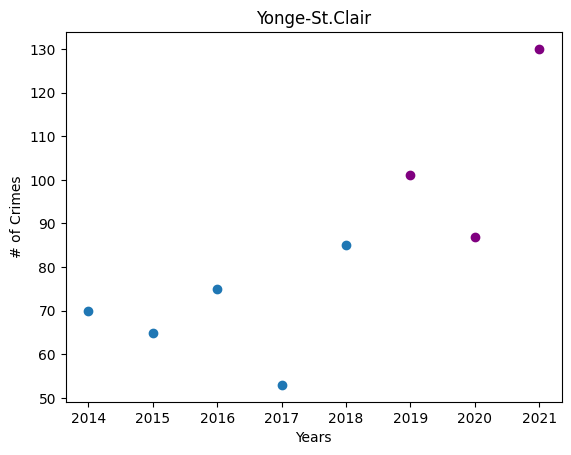

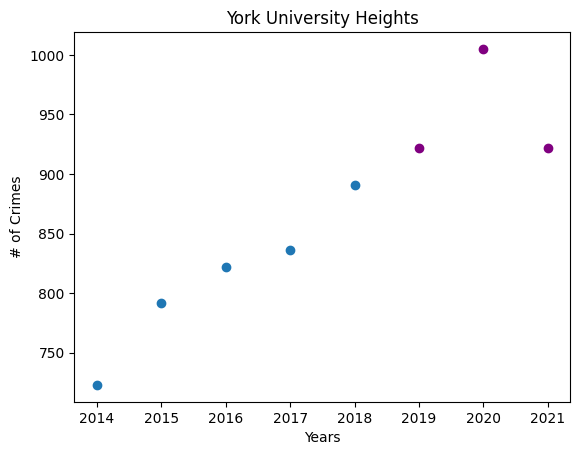

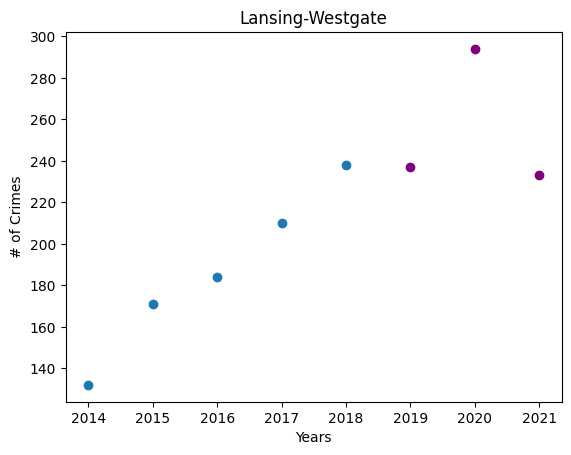

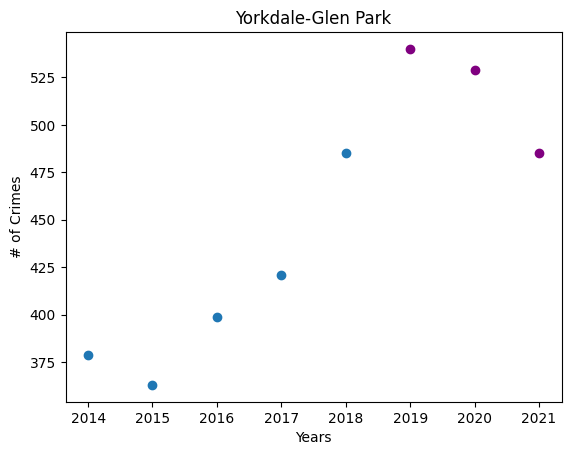

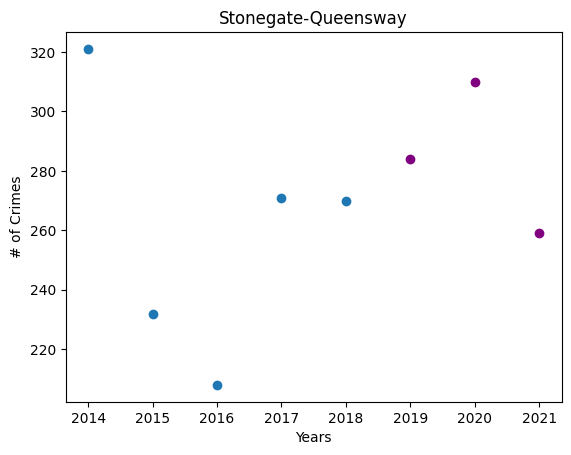

...

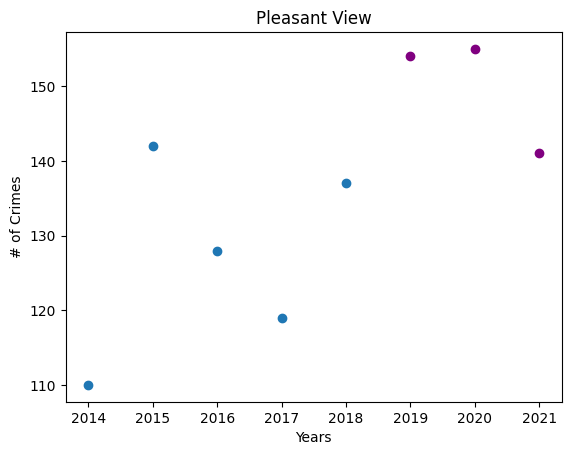

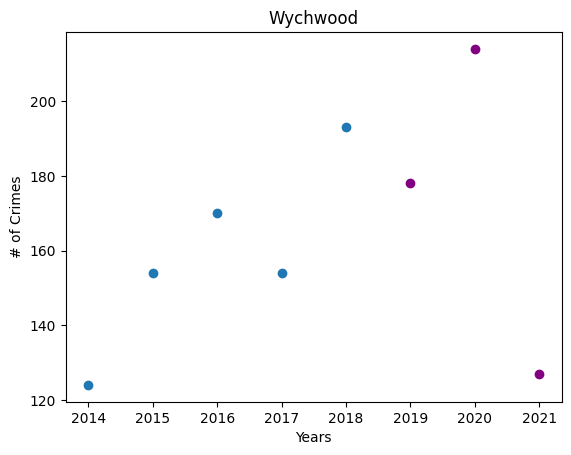

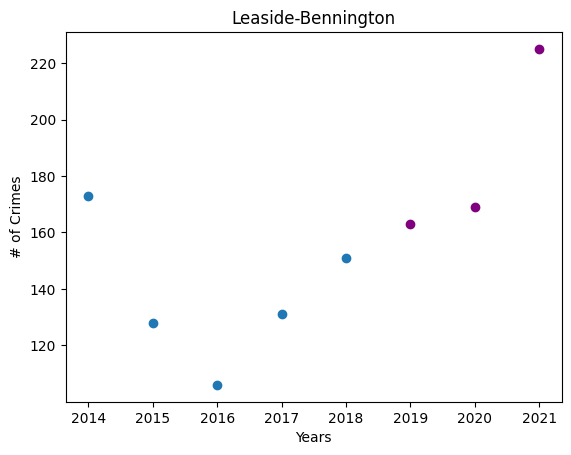

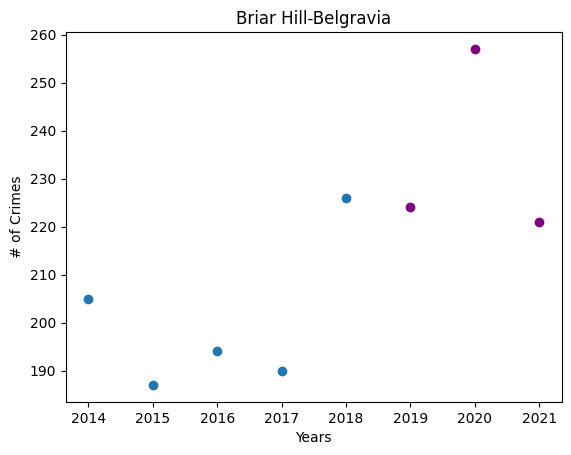

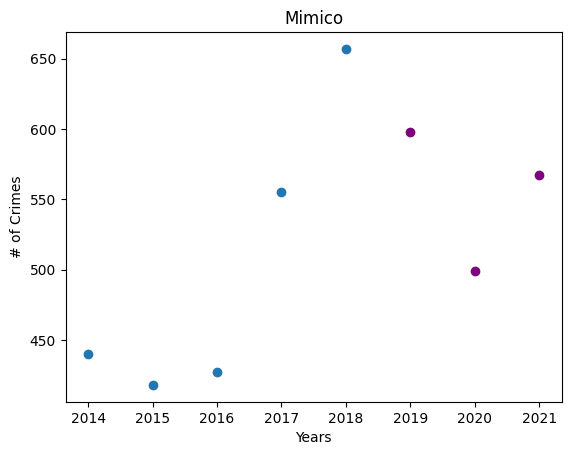

In [16]:
#Ensure no dupliate hood names
HoodNames=totalCrimes["HoodName"].unique()

#Loop through all the hood names and parse out crime for each year, then plot using matplotlib (x-axis: year, y-axis: # of crimes)
for Names in HoodNames:
    Hood_TempName= totalCrimes[totalCrimes["HoodName"] == Names]
    #create the training years array
    years = np.array(range(2014, 2019)).reshape(-1, 1)
    #create the prediction years array
    yearspredict=np.array(range(2019,2022)).reshape(-1, 1)

    #create the crimes training array
    crimes = Hood_TempName[['CrimesIn2014', 'CrimesIn2015', 'CrimesIn2016', 'CrimesIn2017','CrimesIn2018']].values.reshape(-1,1)
    #create the crimes prediction array
    crimesPredict = Hood_TempName[['CrimesIn2019', 'CrimesIn2020', 'CrimesIn2021']].values.reshape(-1,1)

    #plot the data, purple dots are years that will be predicted below, blue dots are training values
    fig, ax = plt.subplots()
    ax.scatter(years,crimes)
    ax.set_title(Names)
    ax.set_xlabel('Years')
    ax.set_ylabel("# of Crimes")
    ax.scatter(yearspredict, crimesPredict, c="purple")
    plt.show()

### Training a linear regression model
This function will take all the information from the csv file and train the model based on linear regression. It will also make predictions for the years 2022, 2023 and 2024. Each neighbourhood will have its own training and prediction model and graph (140 in total)

/var/folders/hm/vpc9c05s2k74b8_fjdgtjf7m0000gn/T/ipykernel_36820/12228819.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


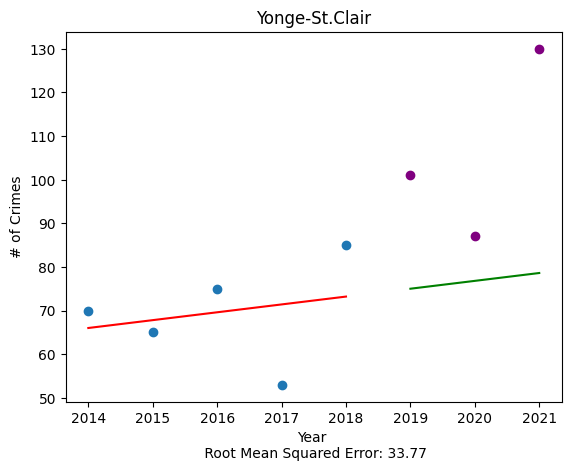

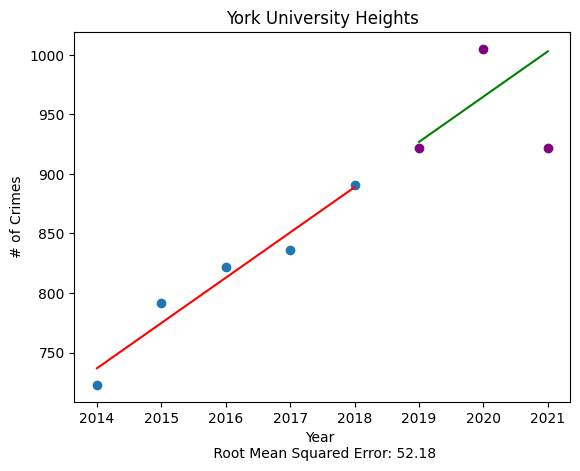

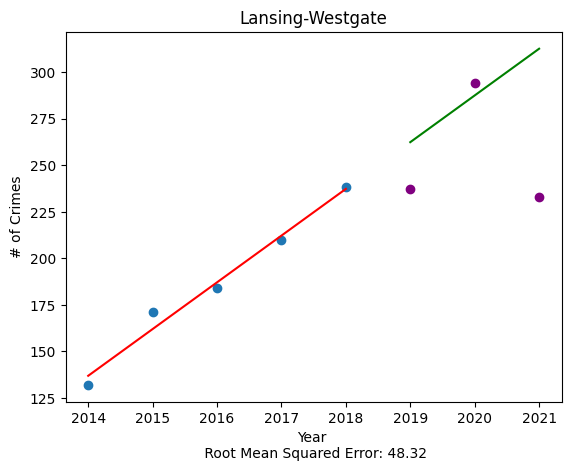

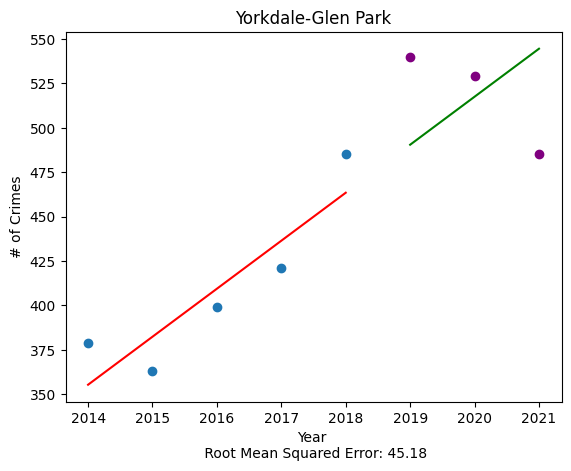

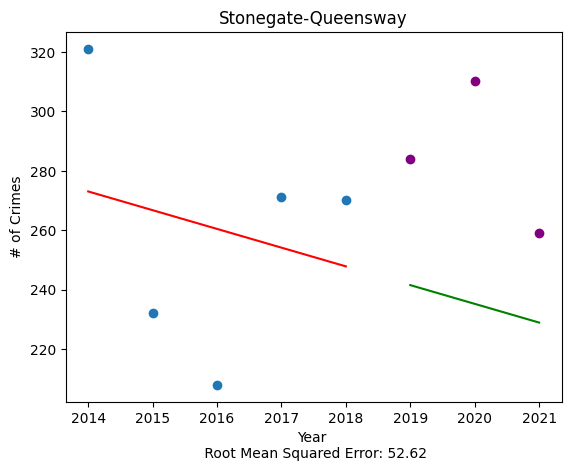

...

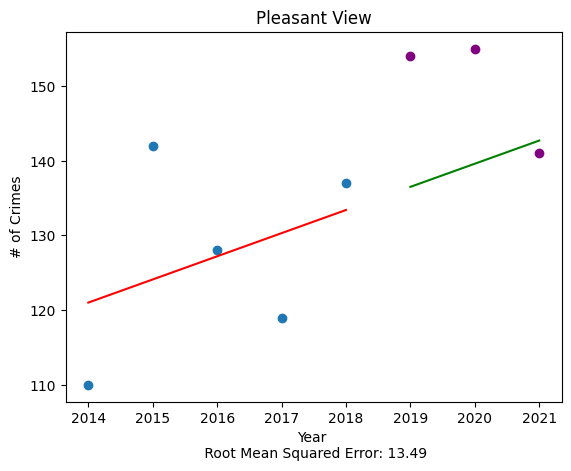

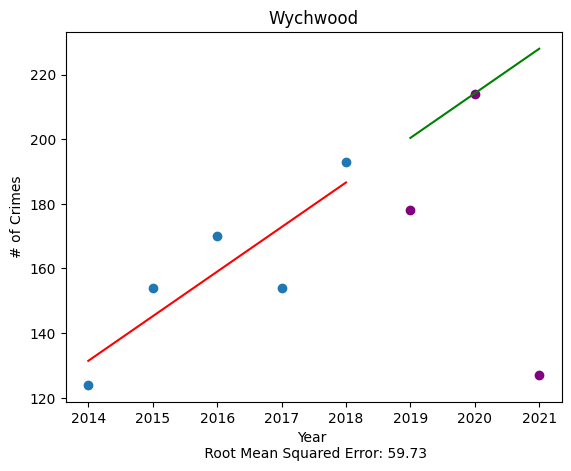

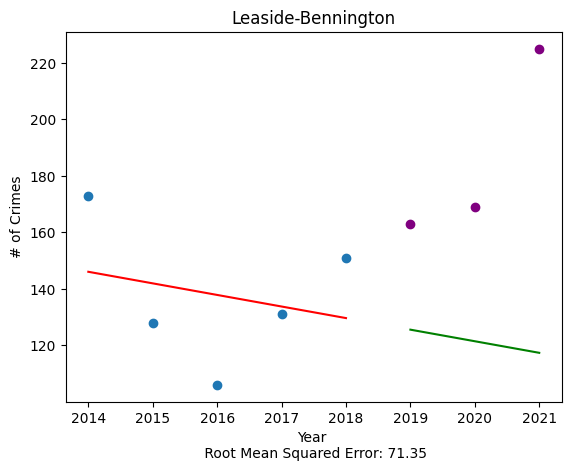

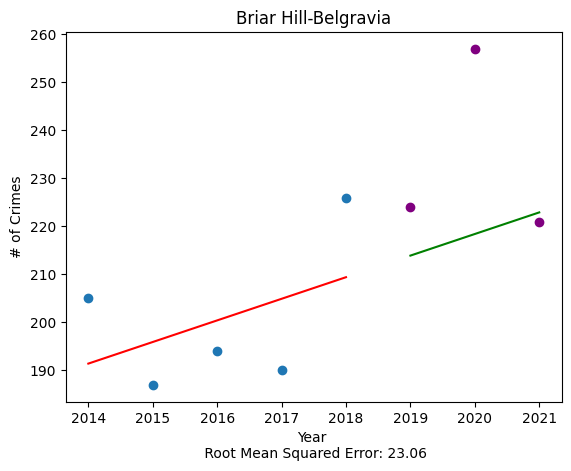

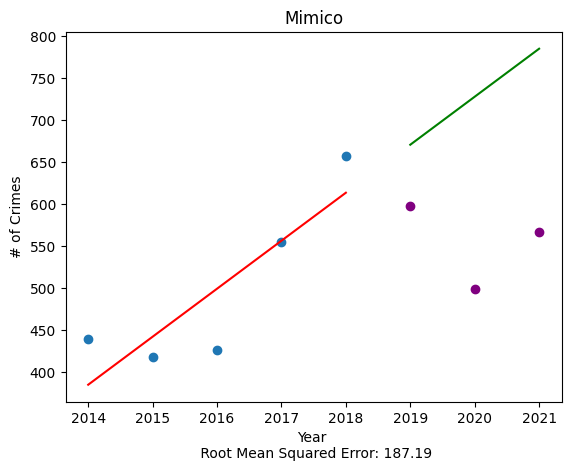

In [17]:
HoodNames=totalCrimes["HoodName"].unique()

#Create a model and train for each unique neighbourhood in the dataset
for Names in HoodNames:
   Hood_TempName= totalCrimes[totalCrimes["HoodName"] == Names]

   #create the training years array and reshape so it can be used in the model fitting
   years = np.array(range(2014, 2019)).reshape(-1, 1)
   yearspredict=np.array(range(2019,2022)).reshape(-1, 1)

   #create the crimes training array and reshape it to be used in model fitting
   crimes = Hood_TempName[['CrimesIn2014', 'CrimesIn2015', 'CrimesIn2016', 'CrimesIn2017','CrimesIn2018']].values.reshape(-1,1)
   crimesPredict = Hood_TempName[['CrimesIn2019', 'CrimesIn2020', 'CrimesIn2021']].values.reshape(-1,1)

   #create the linear regression model and fit it using the data from above
   model=LinearRegression()
   model.fit(years,crimes)

   #assign the years 2022, 2023 and 2024 as the years to predict
   predictionyears= np.array([[2019],[2020],[2021]])
 
   #plot the training data
   fig, ax = plt.subplots()
   ax.scatter(years,crimes)
   ax.set_title(Names)
   ax.set_ylabel("# of Crimes")
   #plot the prediction data vs. the training data
   ax.scatter(yearspredict, crimesPredict, c="purple")
   
   #get the linear regression training line coefficient and intercept
   m = model.coef_
   b = model.intercept_

   #plot the linear regression training line
   y1 = m[0] * years + b
   x1 = years
   plt.plot(x1, y1, '-r')

   #predict the crime in years specified above
   crime_prediction = model.predict(predictionyears)
   #calculate root mean squared error for the predicted values (red line) vs. the actual values (purple dots) and round to 2 decimal places
   rmse = str(np.round(np.sqrt(mean_squared_error(crimesPredict, crime_prediction)), 2))
   #set the x label to years and include rmse below
   ax.set_xlabel("Year \n Root Mean Squared Error: " + rmse)
   #plot the linear regression prediction line
   plt.plot(predictionyears,crime_prediction,color="green")

### Training a second degree polynomial regression model
This function will take the csv file and parse out required information and then based on that information, create and plot a second degree polynomial regression model for each of the 140 neighbourhoods. It will also predict the future crime rate for each of the neighbourhoods

/var/folders/hm/vpc9c05s2k74b8_fjdgtjf7m0000gn/T/ipykernel_36820/1798033213.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


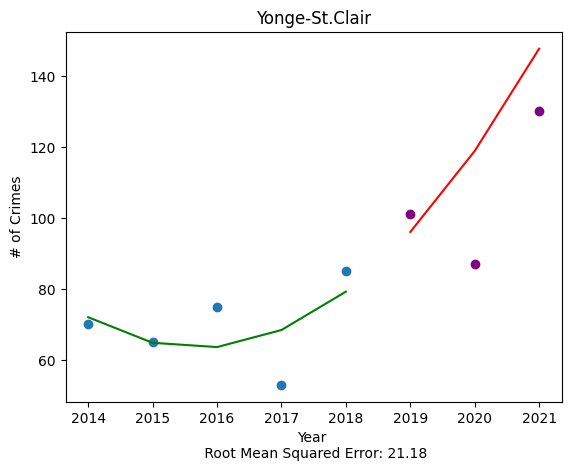

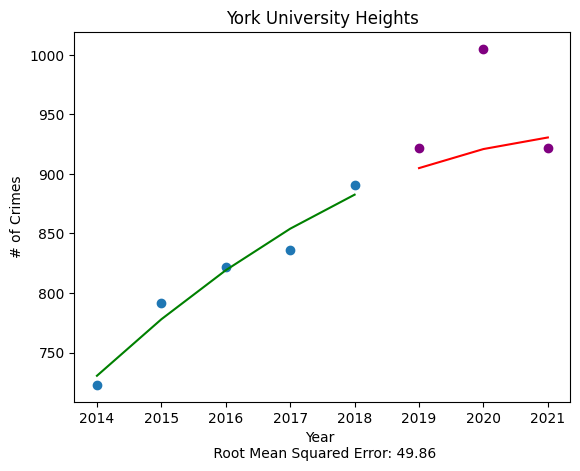

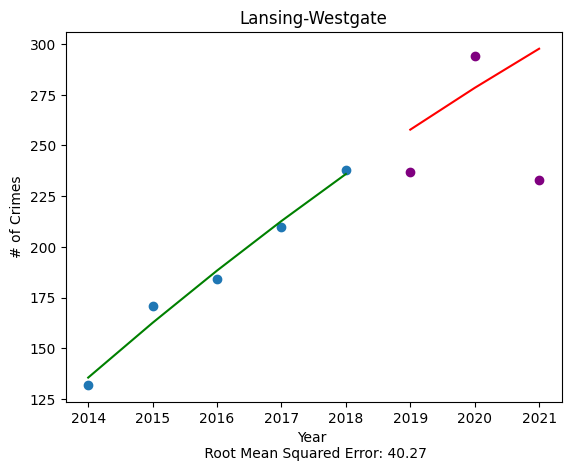

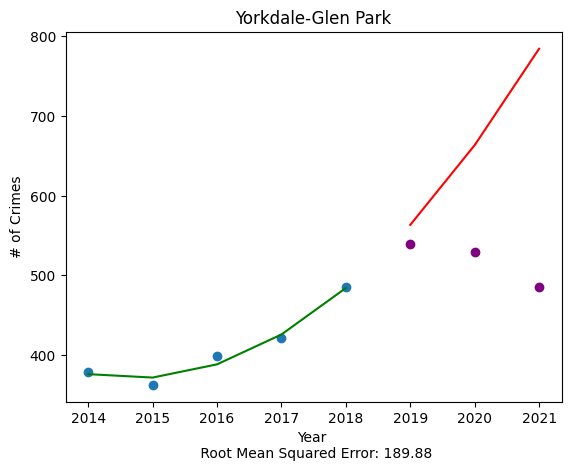

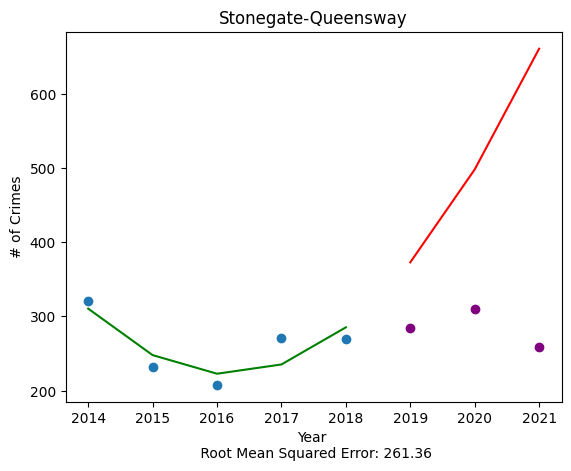

...

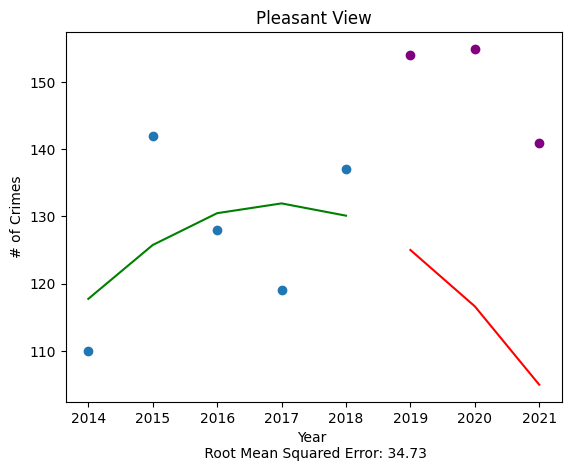

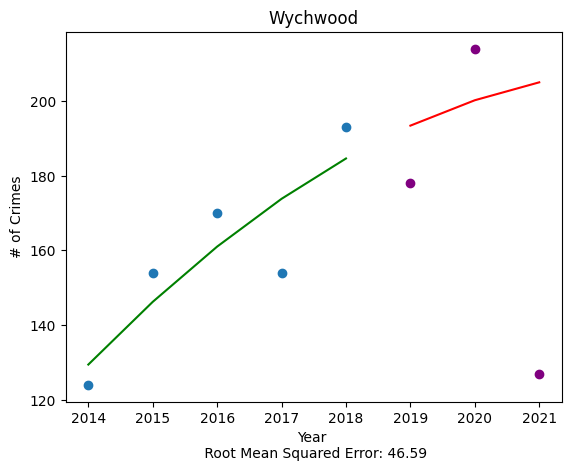

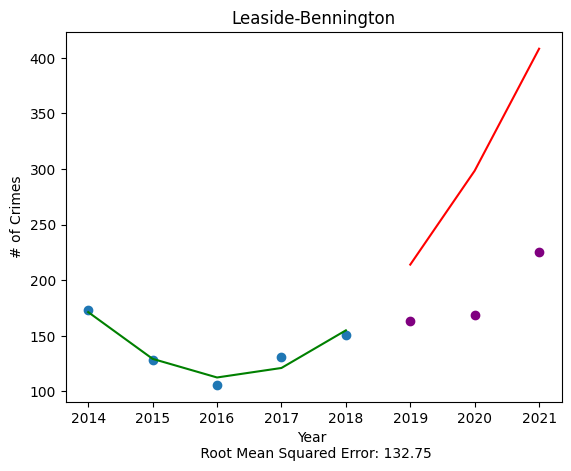

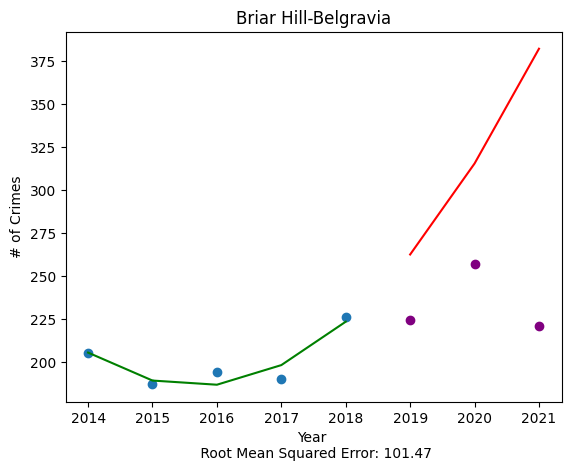

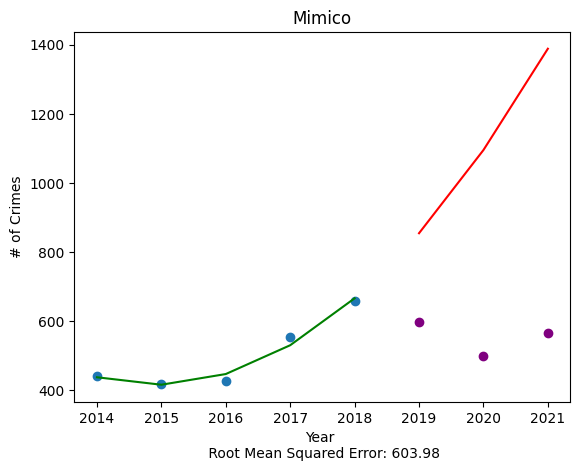

In [18]:
HoodNames=totalCrimes["HoodName"].unique()

#Create a model and train for each unique neighbourhood in the dataset
for Names in HoodNames:
   Hood_TempName= totalCrimes[totalCrimes["HoodName"] == Names]
   #create the training years array and reshape it to be used in the model fitting
   years = np.array(range(2014, 2019)).reshape(-1, 1)
   yearspredict=np.array(range(2019,2022)).reshape(-1, 1)

   #create the crimes training array and reshape it to be used in model fitting
   crimes = Hood_TempName[['CrimesIn2014', 'CrimesIn2015', 'CrimesIn2016', 'CrimesIn2017','CrimesIn2018']].values.reshape(-1,1)
   crimesPredict = Hood_TempName[['CrimesIn2019', 'CrimesIn2020', 'CrimesIn2021']].values.reshape(-1,1)
   
   #set polynomial regression degree to 2 and transform the years to fit the polynomial model
   pfeatures=PolynomialFeatures(degree=2)
   years_poly=pfeatures.fit_transform(years)

   #create the linear regression model and fit the polynomial features and crimes
   model=LinearRegression()
   model.fit(years_poly,crimes)

   #create prediction years array
   predictionyears= np.array([[2019],[2020],[2021]])

   #transform prediction years to fit the polynomial model
   pyears=pfeatures.fit_transform(predictionyears)

   #plot the original data
   fig, ax = plt.subplots()
   ax.scatter(years,crimes)
   ax.set_title(Names)
   #ax.set_xlabel('Years')
   ax.set_ylabel("# of Crimes")
   # plot the actual data for years 2019-2021 (purple dots) in comparison with their predicted polynomial regression values (red line)
   ax.scatter(yearspredict, crimesPredict, c="purple")
   #predict the required years using the polynomial model specified above
   crime_prediction=model.predict(pyears)

   #calculate root mean squared error for the predicted values (red line) vs. the actual values (purple dots) and round to 2 decimal places
   rmse = str(np.round(np.sqrt(mean_squared_error(crimesPredict, crime_prediction)), 2))
   #set the x label to years and include rmse below
   ax.set_xlabel("Year \n Root Mean Squared Error: " + rmse)
   #plot the polynomial regression training and prediction lines
   plt.plot(years, model.predict(pfeatures.fit_transform(years)), color="green")
   plt.plot(predictionyears, crime_prediction, '-r')